In [1]:
from os.path import join, basename, dirname, expanduser
import sys
sys.path.append('../src')
import matplotlib.pyplot as plt
import gta.recording_videos
import numpy as np

In [6]:
# data = gta.recording_videos.find_filenames(base_dir=join(gta.recording_videos.HOME, 'data', 'gta', 'velocity_prediction', 'Protocol V1'))
data = gta.recording_videos.find_filenames(base_dir=join(gta.recording_videos.HOME, 'data', 'gta', 'velocity_prediction', 'Protocol V2'))

Found 5 image recording(s) in C:\Users\tsbertalan\data\gta\velocity_prediction\Protocol V2.
Found 6 telemetry recording(s) in C:\Users\tsbertalan\data\gta\velocity_prediction\Protocol V2.


Pairing data files:   0%|          | 0/5 [00:00<?, ?npz file/s]

Image archive 2021-09-25-17-08-10-gtav_recording.npz is in known.json.
Image archive 2021-09-25-19-06-29-gtav_recording.npz is in known.json.
Image archive 2021-09-25-19-15-25-gtav_recording.npz is in known.json.
Image archive 2021-09-26-15-57-01-gtav_recording.npz is in known.json.
Image archive 2021-09-26-16-10-48-gtav_recording.npz is in known.json.


Pre-cache all tracks into memory (comment this out to load only what's needed, on-demand):

In [7]:
# from tqdm.auto import tqdm
# # pbar = tqdm(total=len(set(sum([list(pair.telemetry_recordings) for pair in data['paired']])))
# # for pair in data['paired']:
# #     for t in pair.telemetry_recordings):
# for t in tqdm(data['bin'], unit='recording'):
#         print('Player vehicle track is', t.track_manager.player_veh.duration, 'seconds long.')

In [8]:
data['paired']

In [18]:
from gta.recording_videos import ImageRecording, TelemetryRecording
from tqdm.auto import tqdm

In [ ]:
from train_velocity_predictor import show_pairing_times

In [20]:
# for p in tqdm(data['paired']):
#     show_pairing_times(p)
#     p.unload_image_data()

Loading ImageRecording("C:\Users\tsbertalan\data\gta\velocity_prediction\Protocol V2\2021-09-26-15-57-01-gtav_recording.npz")


________________________________________________________________________________
[Memory] Calling gta.read_entitystate_data.read_data...
read_data(('C:\\Users\\tsbertalan\\data\\gta\\velocity_prediction\\Protocol '
 'V2\\GTA_recording-422397.bin'))
Protocol version: 2


Reading loaded file:   0%|          | 0/44296 [00:00<?, ?kbytes/s]

Persisting in C:\Users\tsbertalan\data\gta\velocity_prediction\joblib\gta\read_entitystate_data\read_data\d93b1a49bf80b4447ad442aabf6a5d93
_______________________________________________________read_data - 12.2s, 0.2min


Associating entities with tracks:   0%|          | 0/467613 [00:00<?, ?entities/s]

  0%|          | 0/293 [00:00<?, ?it/s]

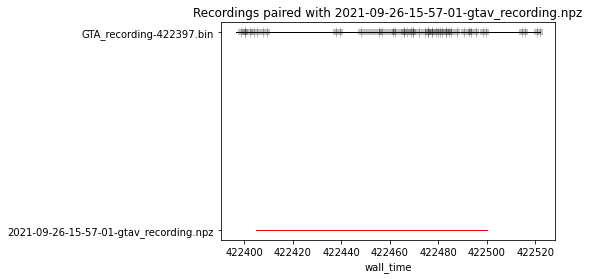

In [165]:
pairing = data['paired'][-2]
show_pairing_times(pairing)

In [166]:
telemetry_recording = pairing.telemetry_recordings[0]

In [167]:
player_tracks = [track for track in telemetry_recording.track_manager.tracks 
                 if track.is_player and track.is_vehicle]
[pv.duration for pv in player_tracks]

[0.682223999989219,
 0.7366550000151619,
 0.40962400002172217,
 3.300001844763756e-05,
 1.8036360000260174,
 1.9280220000073314,
 0.6678930000052787,
 3.899994771927595e-05,
 0.8556959999841638,
 1.1495920000015758,
 0.3837679999996908,
 0.1758409999893047,
 4.299997817724943e-05,
 5.000003147870302e-05,
 4.1000021155923605e-05,
 5.100003909319639e-05,
 0.06516300002112985,
 0.15549999999348074,
 3.4999975468963385e-05,
 3.6999990697950125e-05,
 0.12441200000466779,
 0.11898500000825152,
 6.900000153109431e-05,
 3.300001844763756e-05,
 4.600000102072954e-05,
 4.0000013541430235e-05,
 0.2204630000051111,
 1.721652999985963,
 0.07858800003305078,
 0.0763499999884516,
 0.13992099999450147,
 0.11864699999568984,
 0.09485100000165403,
 0.15481600002385676,
 0.5312019999837503,
 0.4199420000077225,
 0.18431199999758974,
 4.3000036384910345e-05,
 0.45124500000383705,
 0.2068720000097528,
 0.0766040000016801,
 0.024166000017430633,
 4.0000013541430235e-05,
 0.8839659999939613,
 0.5180699999909

In [168]:
telemetry_recording.track_manager.merge_player_tracks()

292

In [169]:
player_tracks = [track for track in telemetry_recording.track_manager.tracks 
                 if track.is_player and track.is_vehicle]
[pv.duration for pv in player_tracks]

[125.41316999995615]

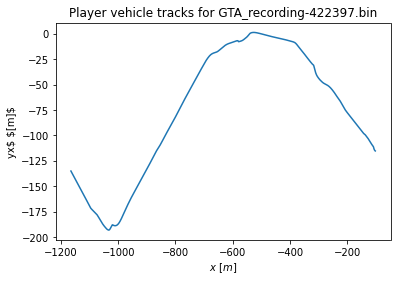

In [170]:
fig, ax = plt.subplots()
for pv in player_tracks:
    ax.plot(pv._get_data('posx'), pv._get_data('posy'))
ax.set_xlabel('$x$ $[m]$')
ax.set_ylabel('$y$ $[m]$')
ax.set_title('Player vehicle tracks for %s' % basename(telemetry_recording.fname));

  0%|          | 0/1 [00:00<?, ?it/s]

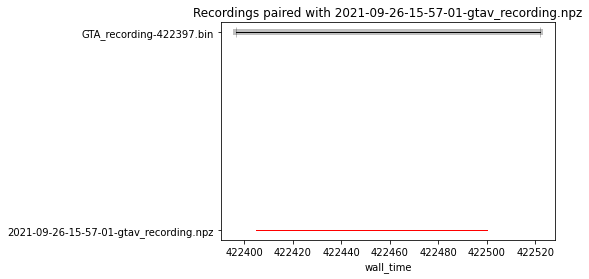

In [171]:
show_pairing_times(pairing)

(<Figure size 864x864 with 1 Axes>, <AxesSubplot:xlabel='x', ylabel='y'>)

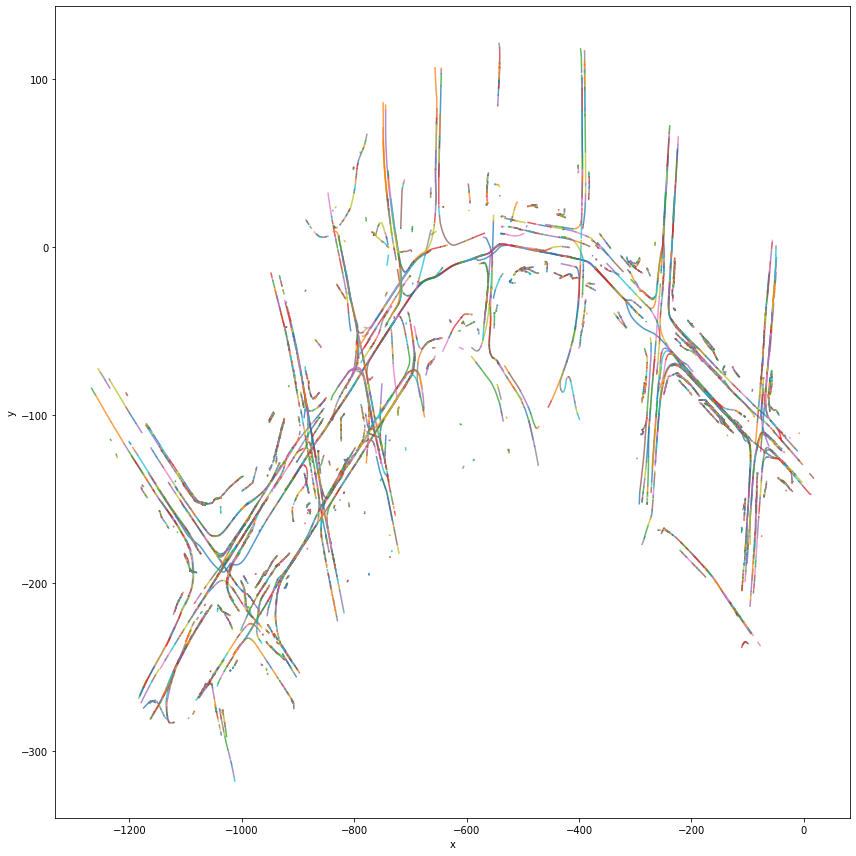

In [172]:
fig, ax = plt.subplots(figsize=(12, 12))
telemetry_recording.track_manager.show_tracks(ax=ax)
ax.set_aspect('equal')

In [173]:
tm = telemetry_recording.track_manager

In [174]:
focal_track = tm.player_veh
# t = (focal_track.tmax +focal_track.tmin) / 2.
# t = focal_track.tmax
# t = focal_track.tmin
resolution=[100]*2
radii=[60.]*2

z_radius=4

In [175]:
(
    focal_track in telemetry_recording.track_manager.tracks,
    telemetry_recording in pairing.telemetry_recordings,
)

(True, True)

In [176]:
focal_track.tmin, focal_track.tmax

(422396.569748, 422521.98291799997)

In [177]:
min(pairing.image_recording.times), max(pairing.image_recording.times)

(422404.875, 422500.218)

In [178]:
image_time_is_in_focal_track = np.logical_and(
    pairing.image_recording.times >= focal_track.tmin,
    pairing.image_recording.times < focal_track.tmax
)
acceptable_indices = np.arange(pairing.image_recording.times.size)[image_time_is_in_focal_track]
print(len(acceptable_indices))
# i = int(np.mean(acceptable_indices))
frac = 0.5
ii = int(frac*len(acceptable_indices))
# i = acceptable_indices[0]
# i = acceptable_indices[-1]
i = acceptable_indices[ii]
t = pairing.image_recording.times[i]

# acceptable_indices

537


In [179]:
mask = tm.local_occupancy_grid(
    t, 
    resolution=resolution,
    radii=radii, 
    focal_track=focal_track,
    z_radius=z_radius
)

In [180]:
# fig, (ax, bx) = plt.subplots(ncols=2)
# ax.scatter(*points_in_focal_frame.T, c=mask.T.ravel())
# # ax.scatter(*points_in_focal_frame.T, c=points_in_focal_frame[:, 0])
# bx.scatter(*points.T, s=1, c=points_in_focal_frame[:, 0])
# # bx.scatter(*(R(entity.yaw) @ points_in_focal_frame.T), c=points_in_focal_frame[:, 0])
# ax.set_aspect('equal')
# bx.set_aspect('equal')

In [181]:
left, right, bottom, top = -radii[0], radii[0], -radii[1], radii[1]

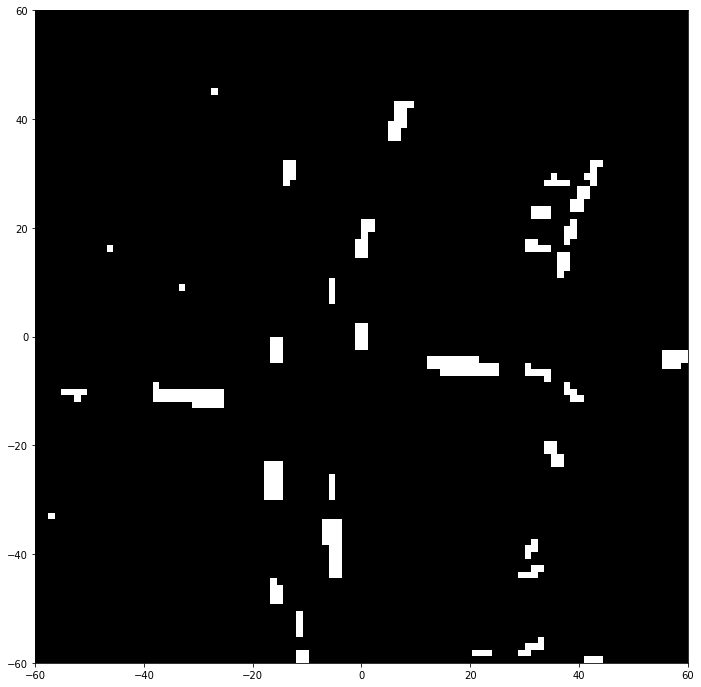

In [182]:
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(mask, origin='lower', extent=[left, right, bottom, top], cmap='Greys')
ax.set_aspect('equal')

(-90.30497413951076, 29.69502586048924)

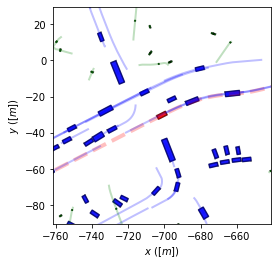

In [183]:
fig, ax = tm.show_occupancy(t)
entity = focal_track.get_interpolated_state(t)
ax.set_xlim(left + entity.posx, right+entity.posx)
ax.set_ylim(bottom+entity.posy, top+entity.posy)

In [184]:
i_closest = np.argmin(np.abs(pairing.image_recording.times - t))
i_closest, len(pairing.image_recording.times)

(268, 537)

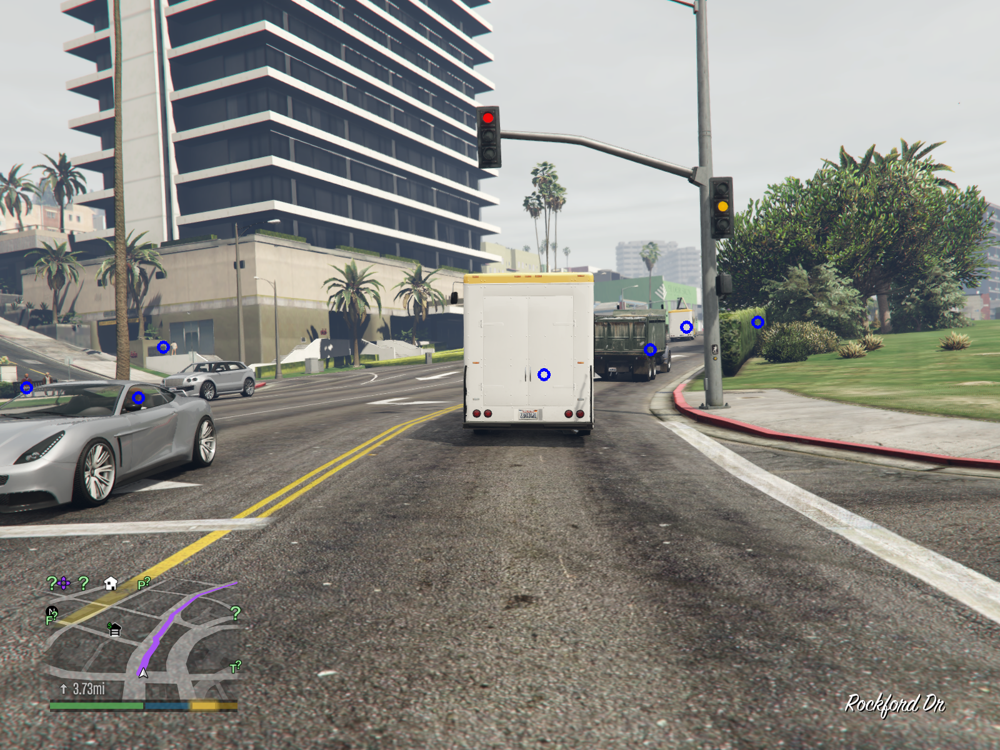

In [185]:
img = np.copy(pairing.image_recording.images[i_closest])

import cv2

for track in tm.get_active_tracks(t):
    state = track.get_interpolated_state(t)
    x, y = state.screenx, state.screeny
    occluded = state.is_occluded
    obstructed_color=(0, 255, 0)
    unobstructed_color=(0, 0, 255)
    if x > 0 and y > 0:
        i = int(np.math.floor(y * img.shape[0]))
        j = int(np.math.floor(x * img.shape[1]))
        if x != -1 and y != -1:
            r = int(img.shape[0]*y)
            c = int(img.shape[1]*x)
            R = 8
            cv2.circle(img, (c, r), R, obstructed_color if occluded else unobstructed_color, 3)

from PIL.Image import fromarray

fromarray(img)

In [186]:
type(pairing.image_recording.images)

list

In [187]:
feet_mile = 5280.
feet_m = 3.2808
sec_h = 60.**2

In [188]:
miph_mps =  feet_m / feet_mile * sec_h

In [199]:
import scipy.spatial.transform
def get_local_to_global_rot(st):
#     yaw = np.radians(state_tuple.yaw)
#     pitch = np.radians(state_tuple.pitch)
#     roll = np.radians(state_tuple.roll)
    return scipy.spatial.transform.Rotation.from_euler(
        seq='XZY', 
        angles=[st.pitch, st.yaw, st.roll], # Based on UVN camera from here http://athena.ecs.csus.edu/~gordonvs/165/resources/03-FundamentalsOf3D.pdf
        degrees=True
    )

Which Euler definition is it??

Well, in order to tell, we'll need a dataset with some nonzero pitch and roll values. If only yaw changes, then the various `XYZ` permutations all do the same thing.

Text(0.5, 0, 't')

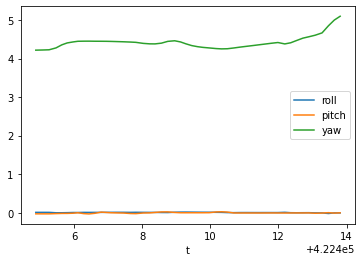

In [270]:
fig, ax = plt.subplots()
ax.plot(times, np.radians([r for (x, y, z, r, p, y) in poses]), label='roll')
ax.plot(times, np.radians([p for (x, y, z, r, p, y) in poses]), label='pitch')
ax.plot(times, np.radians([y for (x, y, z, r, p, y) in poses]), label='yaw')
ax.legend()
ax.set_xlabel('t')

However, we can tell that the car's coordinate system has positive $y$ pointing forward, since we need to multiply the rotation matrix by $[0, 1, 0]$ to get the right forward vector.

I'm assuming it's right-handed, and so $x$ poins right, and $z$ points up.

It doesn't matter which way is North -- $x$ and $y$ that we get from the data just are what they are -- but, from the screenshots and corresponding visualizations, it seems to be positive $y$, and positive $x$ points East.

This does tell us that the global/map coordinate system is right-handed, and so it's a pretty good bet that the local/car frame is too.

In [268]:
def pair_images_with_ego_velocities(pairing):
    times = []
    images = []
    velocities = []
    directional_velocities = []
    forward_vectors = []
    vvecs = []
    poses = []
    try:
        for iimg, (img, t) in enumerate(zip(tqdm(pairing.image_recording.images, unit='frames'), pairing.image_recording.times)):
            vel_recorded = False
            for telemetry_recording in pairing.telemetry_recordings:            
                tm = telemetry_recording.track_manager
                for track in tm.get_active_tracks(t):
                    if track.is_vehicle and track.is_player:
                        st = track.get_interpolated_state(t)
                        R = get_local_to_global_rot(st)
                        p = R.apply(np.array([0, 1, 0]))
                        v = np.array([st.velx, st.vely, st.velz])
#                         yaw = np.radians(st.yaw)
#                         pitch = np.radians(st.pitch)
#                         p = np.array([
#                             np.sin(yaw)*np.cos(pitch), 
#                             np.cos(yaw)*np.cos(pitch), 
#                             np.sin(pitch)
#                         ])
                        forward = (v @ p) > 0
                        vel_meters_per_second = np.linalg.norm(v) * (1 if forward else -1)
                        velocities.append(vel_meters_per_second)
                        directional_velocities.append(v @ p)
                        vvecs.append(v)
                        poses.append(np.array([st.posx, st.posy, st.posz, st.roll, st.pitch, st.yaw]))
                        forward_vectors.append(p)
                        vel_recorded = True
                        break
                if vel_recorded:
                    break
            if vel_recorded:
                images.append(img)
                times.append(t)
            #if iimg > 50:
            #    raise KeyboardInterrupt
    except KeyboardInterrupt:
        imax = min([len(z) for z in (times, images, velocities, directional_velocities, vvecs, poses, forward_vectors)])
        times = times[:imax]
        images = images[:imax]
        velocities = velocities[:imax]
        directional_velocities = directional_velocities[:imax]
        vvecs = vvecs[:imax]
        poses = poses[:imax]
        forward_vectors = forward_vectors[:imax]
    return times, images, velocities, directional_velocities, vvecs, poses, forward_vectors

In [269]:
times, images, velocities, directional_velocities, vvecs, poses, forward_vectors = pair_images_with_ego_velocities(
    pairing
)

  0%|          | 0/537 [00:00<?, ?frames/s]

(-202.2449972833572, -182.2449972833572)

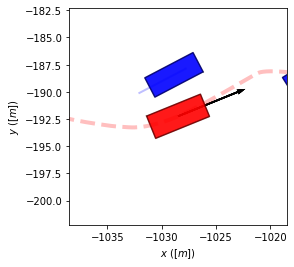

In [271]:
from itertools import permutations

fig, ax = tm.show_occupancy(times[-1])
entity = focal_track.get_interpolated_state(times[-1])
ax.set_xlim(left + entity.posx, right+entity.posx)
ax.set_ylim(bottom+entity.posy, top+entity.posy)

angle_dict = dict(X=entity.roll, Y=entity.pitch, Z=entity.yaw)

rotated_vectors = []
for order in permutations('XYZ', 3):
    order = ''.join(order)
    R = scipy.spatial.transform.Rotation.from_euler(
        seq=order,
        angles=[angle_dict[letter] for letter in order],
        degrees=True,
    )
    rotated_vector = R.apply(np.array([0, 1., 0]))
    rotated_vectors.append(rotated_vector)
    x = entity.posx
    y = entity.posy
    u, v = rotated_vector[:2]
    ax.quiver(x, y, u, v, linewidth=4, angles='xy', scale=3)
    rad = 10
ax.set_xlim(x-rad, x+rad)
ax.set_ylim(y-rad, y+rad)

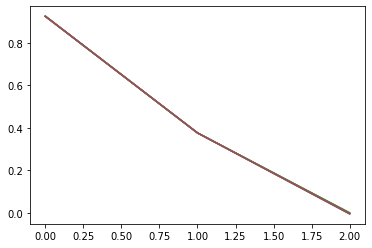

In [272]:
fig, ax = plt.subplots()
for v in rotated_vectors:
    ax.plot(v)

In [273]:
# from itertools import permutations
# variations = []

# for t in tqdm(times, unit='frames'):
#     entity = focal_track.get_interpolated_state(times[0])

#     angle_dict = dict(X=entity.roll, Y=entity.pitch, Z=entity.yaw)

#     rotated_vectors = []
#     for order in permutations('XYZ', 3):
#         order = ''.join(order)
#         R = scipy.spatial.transform.Rotation.from_euler(
#             seq=order,
#             angles=[angle_dict[letter] for letter in order],
#             degrees=True,
#         )
#         rotated_vector = R.apply(np.array([0, 1., 0]))
#         rotated_vectors.append(rotated_vector)
#     rotated_vectors = np.array(rotated_vectors)
#     variation = np.mean(np.std(rotated_vectors, axis=0))
#     variations.append(variation)
    

In [274]:
# fig, ax = plt.subplots()
# ax.plot(times, variations)

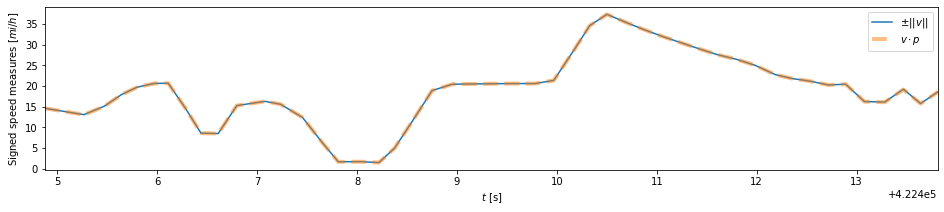

In [275]:
fig, ax = plt.subplots(figsize=(16, 3))
ax.plot(times, np.array(velocities)*miph_mps, label='$\pm ||v||$')
ax.plot(times, np.array(directional_velocities)*miph_mps, label='$v \cdot p$', linewidth=4, alpha=.5, linestyle='--')
ax.legend()
ax.set_xlim(times[0], min(times[-1], times[0] + 30))
ax.set_xlabel('$t$ [s]')
ax.set_ylabel('Signed speed measures $[mi/h]$');

In [281]:
np.abs(np.array(velocities) - np.array(directional_velocities)).max() * miph_mps

0.08212926066951176

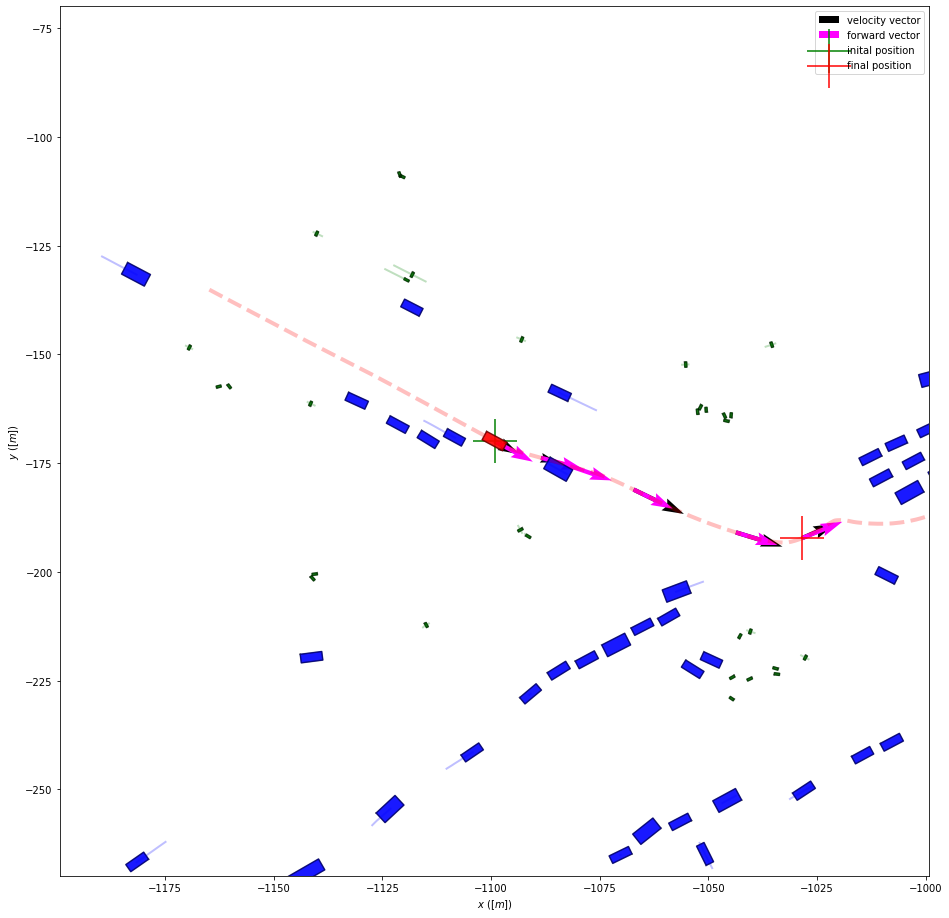

In [304]:
fig, ax = tm.show_occupancy(times[0])
fig.set_size_inches(16, 16)
entity = focal_track.get_interpolated_state(times[0])
ax.set_xlim(left + entity.posx, right+entity.posx)
ax.set_ylim(bottom+entity.posy, top+entity.posy)

# fig, ax = plt.subplots()

skip = 10
x = [p[0] for p in poses]
y = [p[1] for p in poses]
u = [vec[0] for vec in vvecs]
v = [vec[1] for vec in vvecs]
w = .005
scale = 200
ax.quiver(
    x[::skip], y[::skip], u[::skip], v[::skip], 
    scale=scale, linewidth=3, color='black', angles='xy', width=w, label='velocity vector')
u = [pv[0] for pv in forward_vectors]
v = [pv[1] for pv in forward_vectors]
ax.quiver(
    x[::skip], y[::skip], u[::skip], v[::skip], 
    scale=scale/10, linewidth=3, color='magenta', angles='xy', width=w, label='forward vector')
ax.scatter(x[0], y[0], color='green', label='inital position', s=2000,  marker='+')
ax.scatter(x[-1], y[-1], color='red', label='final position',  s=2000,  marker='+')
# ax.set_xlim(min(x), max(x))
# ax.set_ylim(min(y), max(y))
rad=100
ax.set_xlim(entity.posx-rad, entity.posx+rad)
ax.set_ylim(entity.posy-rad, entity.posy+rad)
ax.legend()

In [277]:
assert not (np.array(times) - np.array(sorted(times))).any()

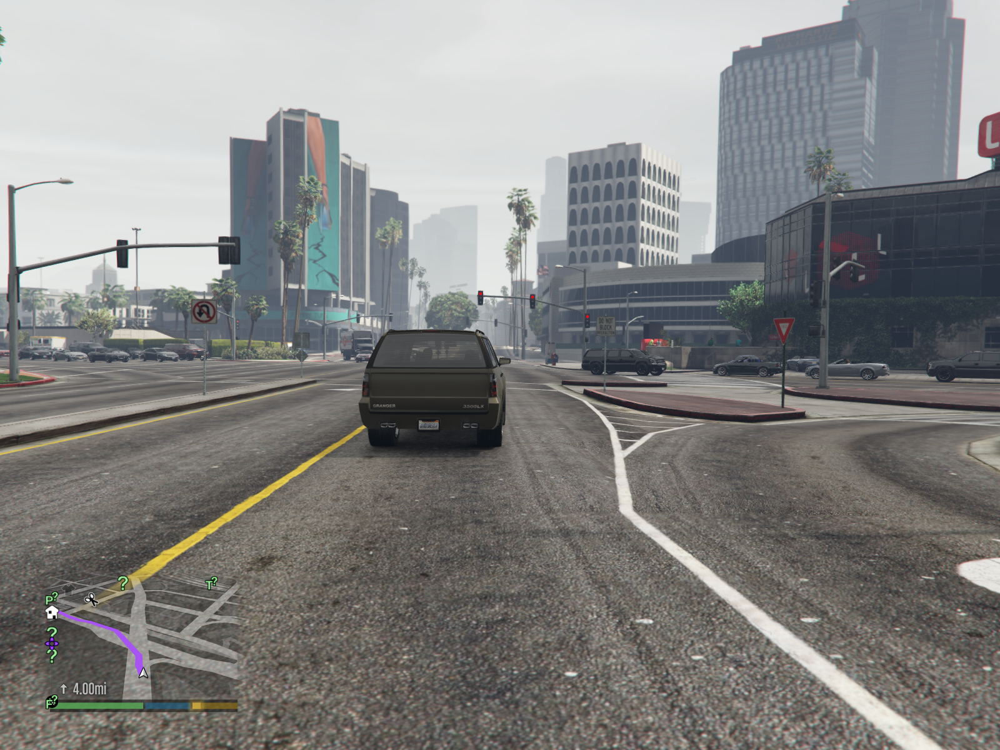

In [247]:
fromarray(images[0])

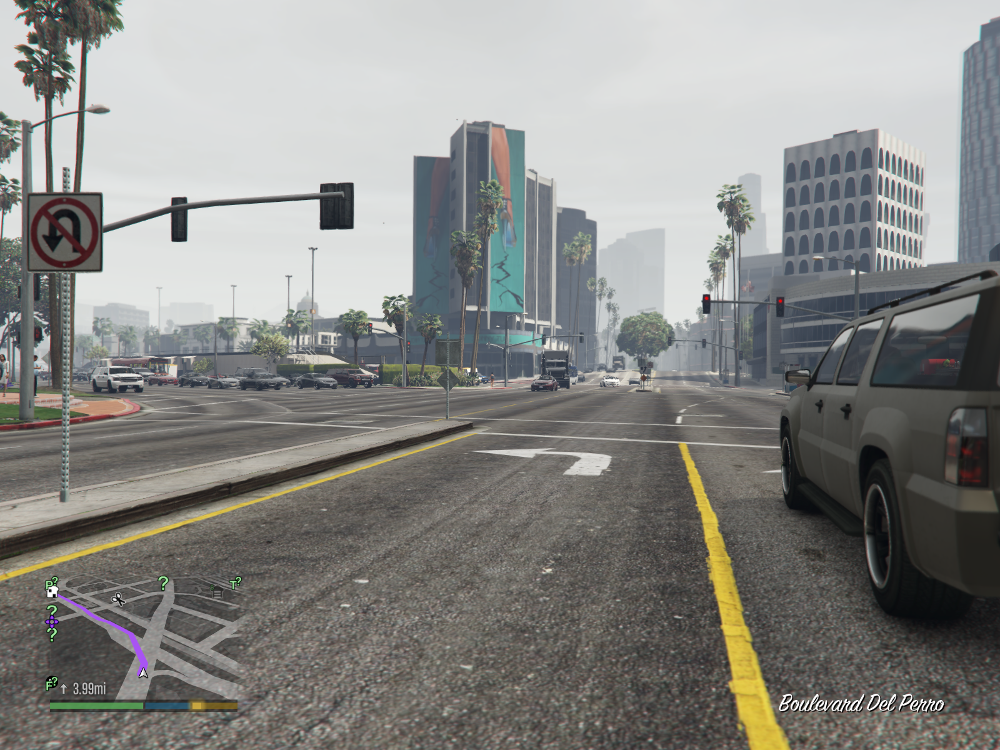

In [254]:
fromarray(images[16])

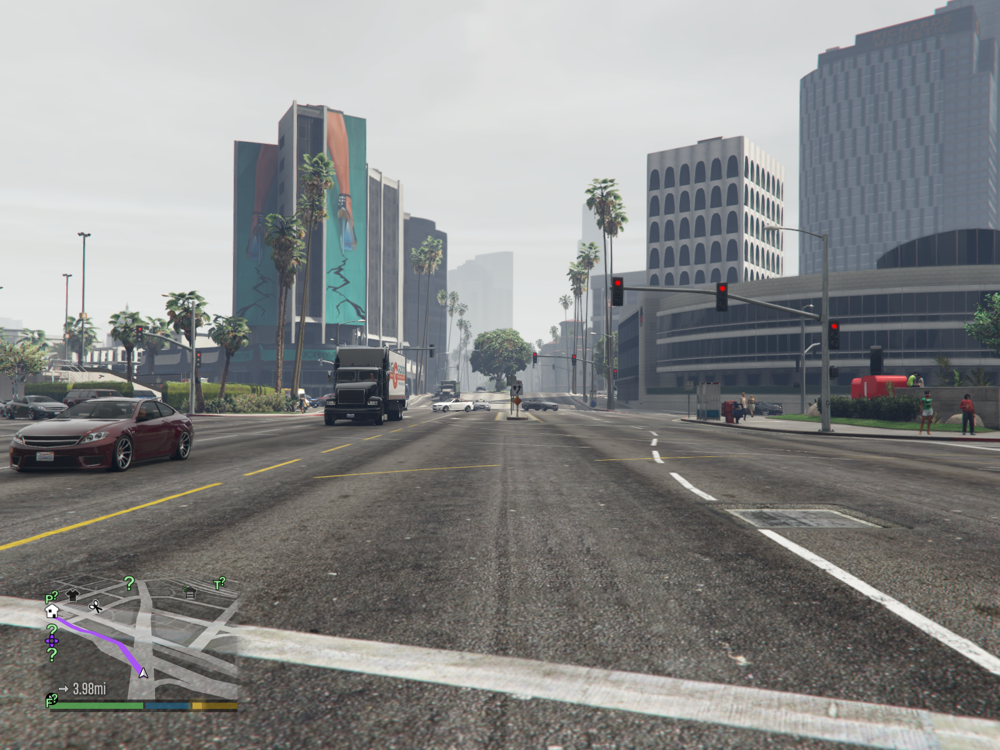

In [255]:
fromarray(images[32])

In [211]:
st = player_tracks[0].get_interpolated_state(times[0])
st.posx, st.posy

(-1099.1893234440086, -169.9307097648453)

In [212]:
# pairing.write_video()